#### Introduction #### 
OpenAI came out with their new 4o Image Generation this week, and I'm curious how its output compares to image results from DALL·E 3 and Gemini 2.0 Flash.

I'm going to test this out today using a prompt that asks for a picture of someone standing in Washington Square West, a neighborhood in Philadelphia. 

#### OpenAI's 4o Image Generation ####
Inspired by the image generation example in the [product release](https://openai.com/index/introducing-4o-image-generation/), I'm going to create a prompt that is: 

1. Very detailed

2. Shows a person

3. Shows text 

Here's my prompt: 

> A wide image taken with a phone of a woman wearing a T-Shirt that has a large La Colombe logo on it. She is standing at 9th and Pine in Philadelphia, PA, in the Washington Square West neighborhood. There are cherry blossoms blooming nearby. She holds a sign. It says, in the style of an "I heart New York" sign:
>
> (Top) 
> I love Washington Square West
>
> (Bottom)
> Best neighborhood in Philadelphia!
>
> In the background, a SEPTA bus is whizzing by. The overall schene is beautiful and is meant to inspire people to move to the Washington Square West neighborhood. 

Here's the initial output: 
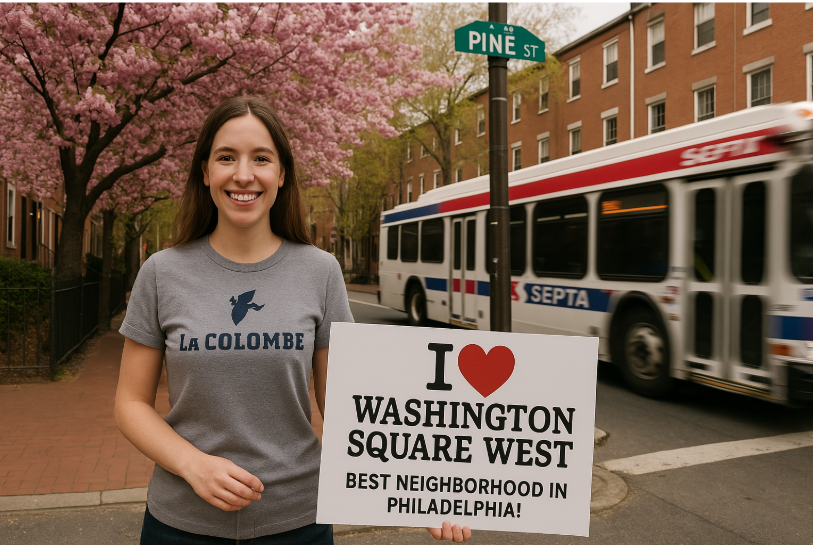

Quite impressive. I ran up against some rate limits, so I'm not going to be able to regenerate this today. 



#### Gemini Flash 2.0 Experimental #### 
I gave Gemini the same prompt as I gave OpenAI. It produced an image much more quickly, and the result was not nearly as good! 
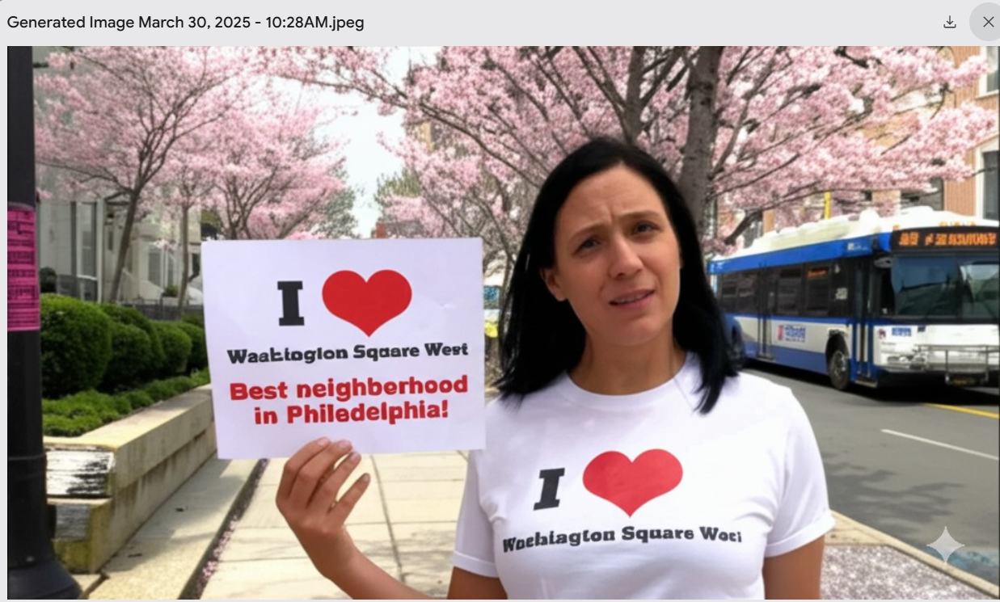

Here are a few re-generations: 
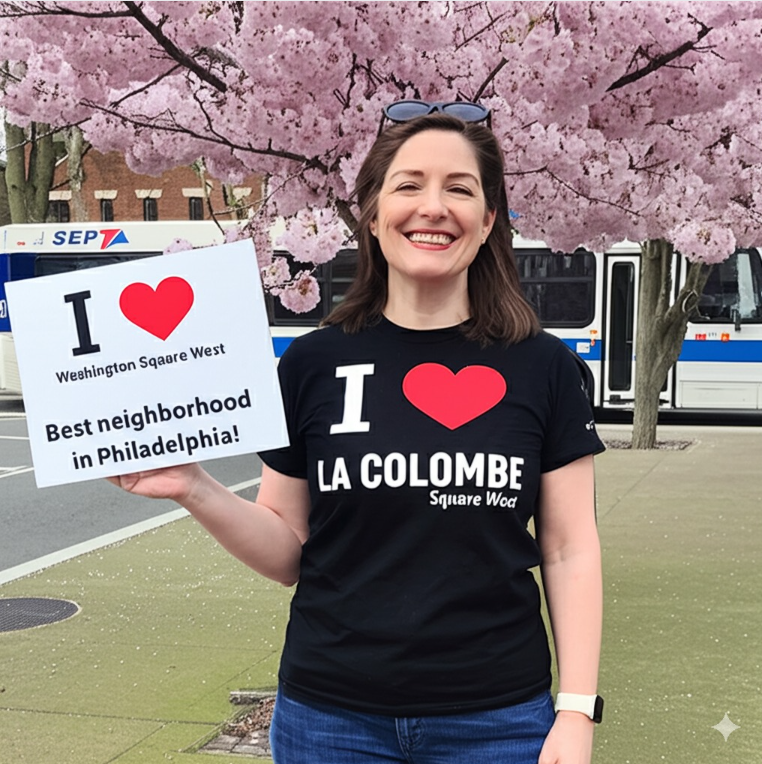
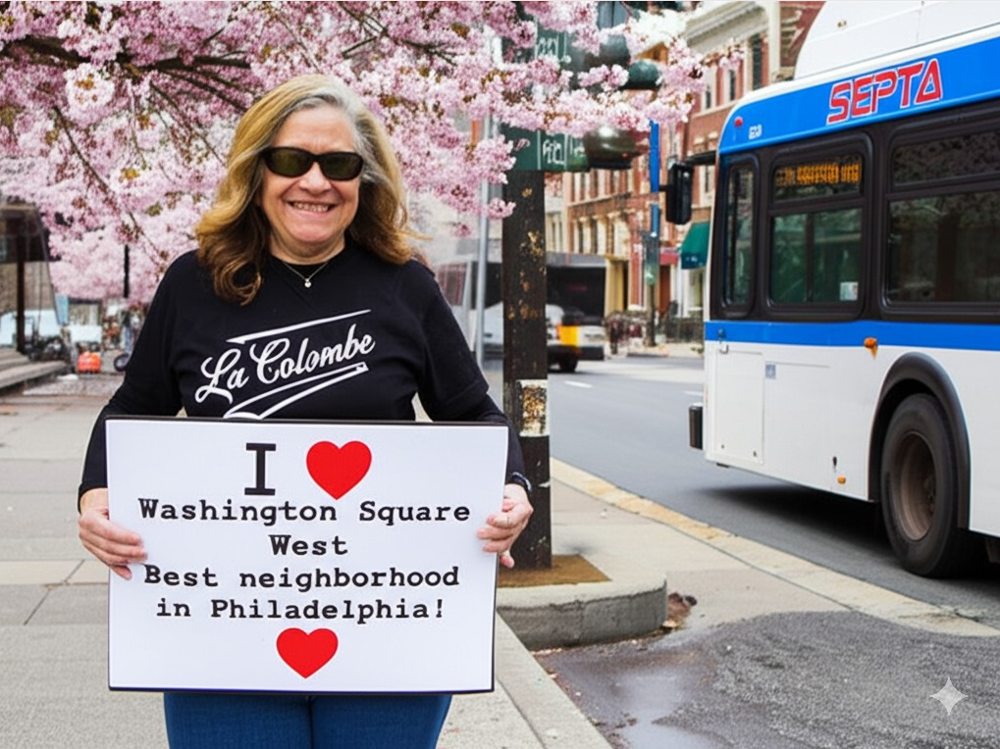

There's lots of variation across generations. The woman changes, as does the branding of the SEPTA bus! (These SEPTA logos must be from before I moved to Philadelphia-- I can't say I've ever seen them before). 

Let's see to what extent I can edit the image. I'm going to ask for the sign to now appear handwritten. 
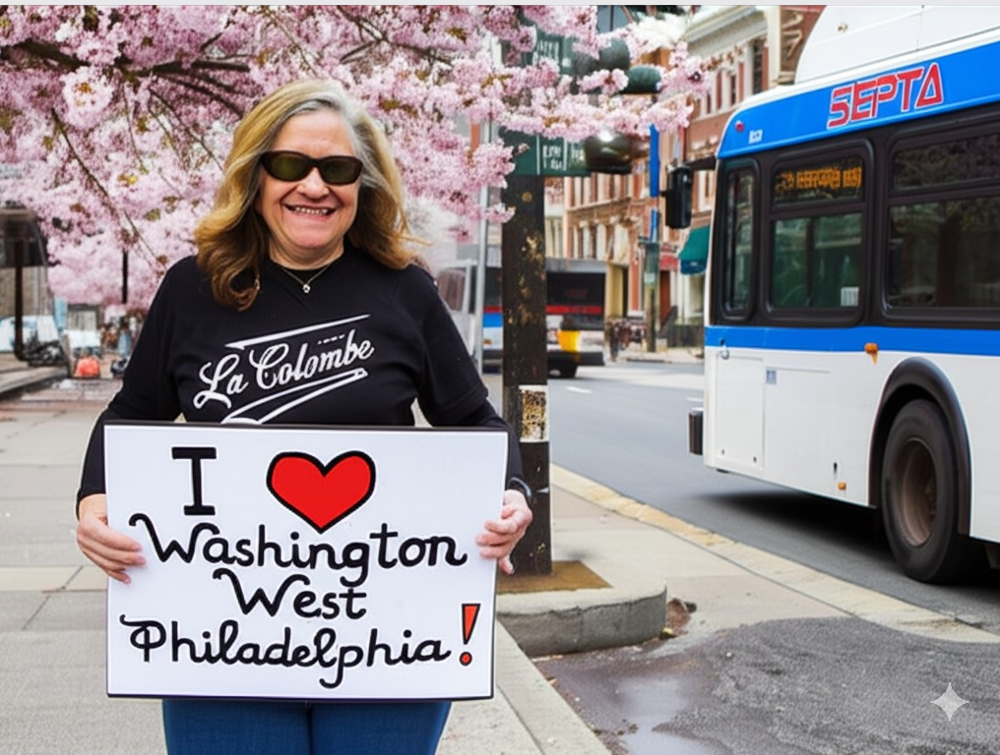
Pretty good! 

#### DALL·E 3 ####

Let's see what DALL·E 3 is able to do when given the same prompt. 

In [3]:
from openai import OpenAI
import os
import base64
import requests

from dotenv import load_dotenv
# Load API key
_ = load_dotenv()

def encode_image(image_path):
  with open(image_path, "rb") as image_file:
    return base64.b64encode(image_file.read()).decode('utf-8')

client = OpenAI()

In [7]:
image_prompt = '''
A wide image taken with a phone of a woman wearing a T-Shirt that has a large La Colombe logo on it. She is standing at 9th and Pine in Philadelphia, PA, in the Washington Square West neighborhood. There are cherry blossoms blooming nearby. She holds a sign. It says, in the style of an "I heart New York" sign:

(Top)
I love Washington Square West

(Bottom)
Best neighborhood in Philadelphia!

In the background, a SEPTA bus is whizzing by. The overall schene is beautiful and is meant to inspire people to move to the Washington Square West neighborhood.
'''

response = client.images.generate(
  model="dall-e-3",
  prompt=image_prompt,
  size="1024x1024",
  quality="standard",
  n=1,
)

image_url = response.data[0].url

Here's the initial output: 
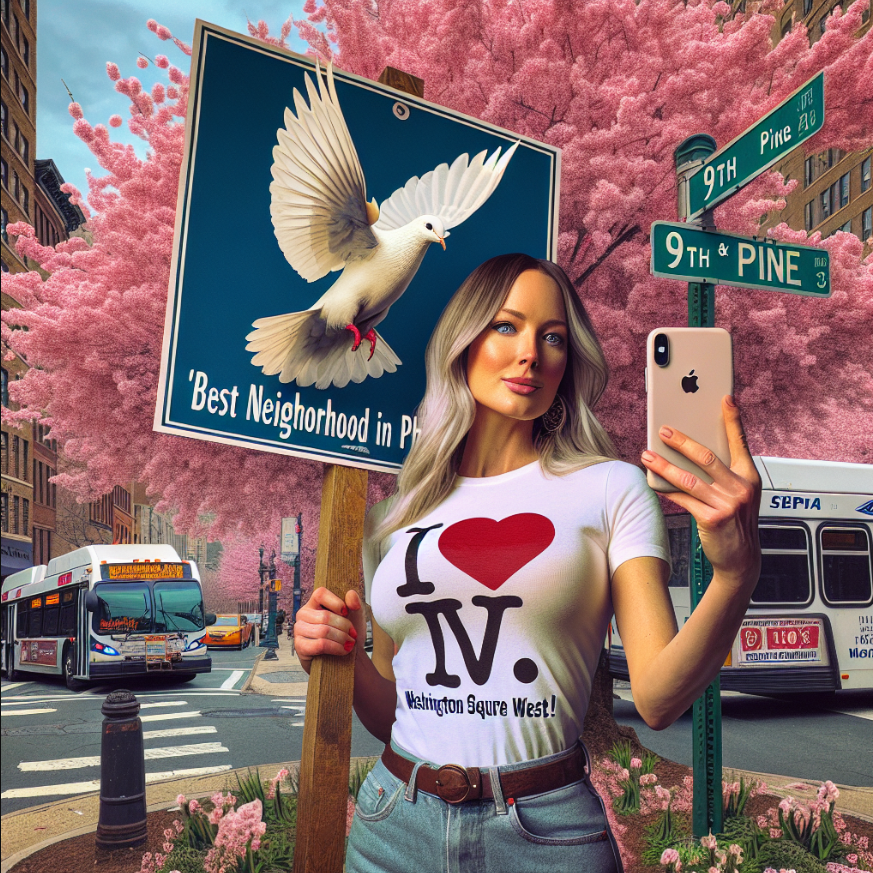

Take 2: 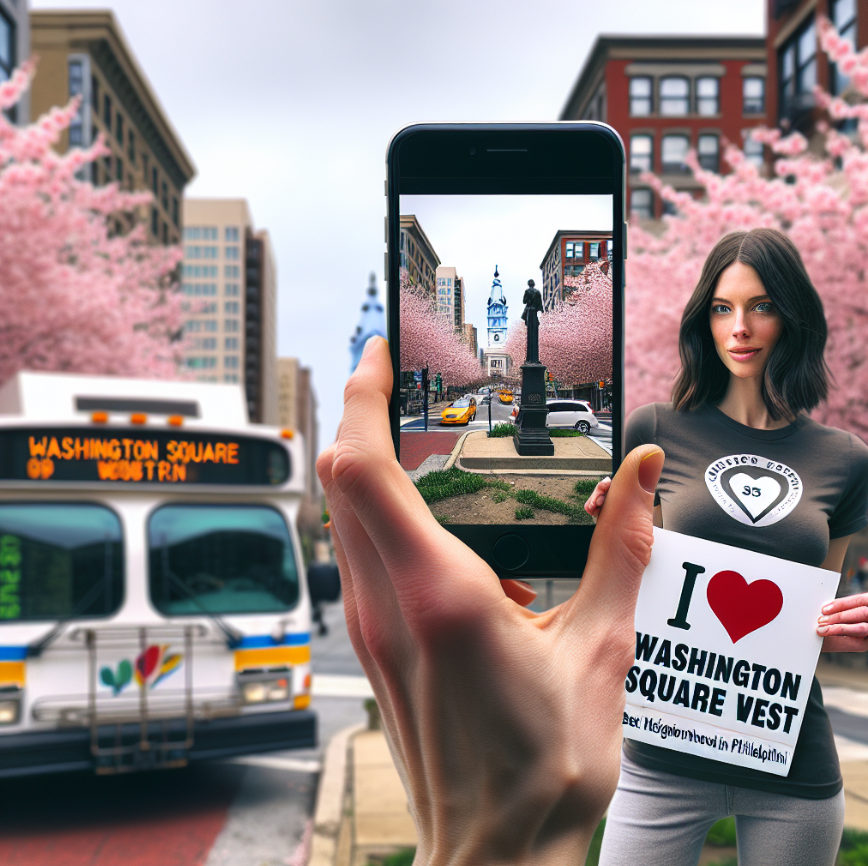

Take 3: 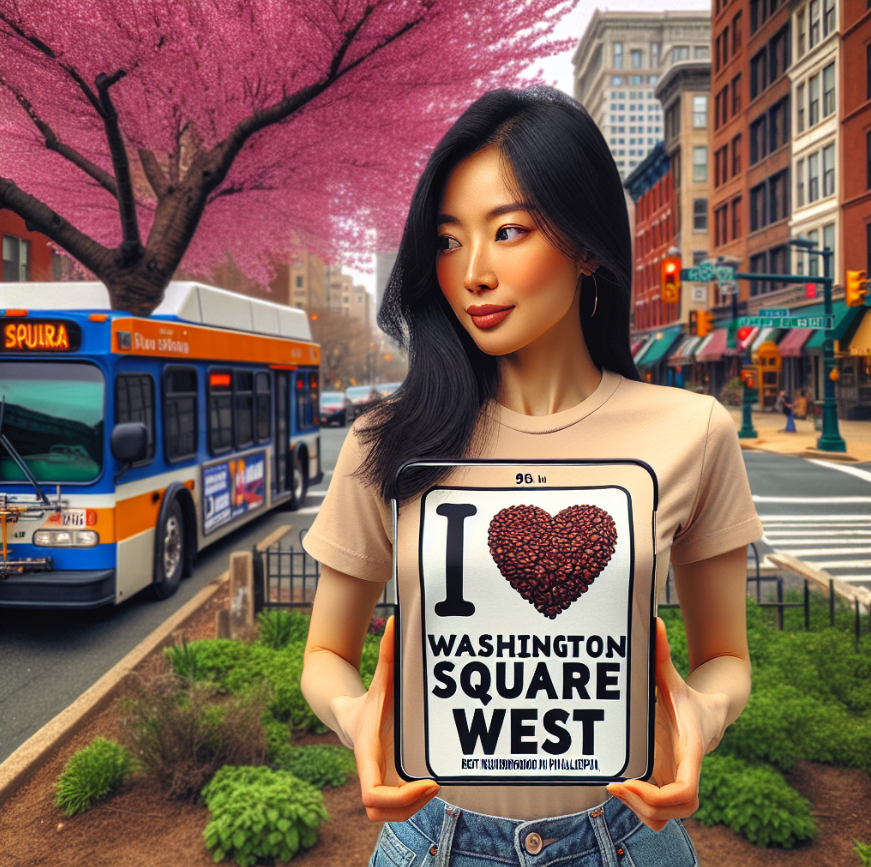

#### Takeaways #### 

OpenAI’s 4o Image Generation clearly blows its competition out of the water. While I wasn't able to regenerate with my free account to swee if it's more consistent across generations than its other image generation models, the image was much more realistic than the images produced by other models. The sign looks pretty good and the SEPTA bus looks modern and accurate. The Pine St sign is a nice touch and looks just like what Philadelphia's street signs look like. The La Colombe logo on her shirt also looks pretty good! 

Gemini Flash 2.0 Experimental was also able to make some pretty realistic images. In comparison to 4o Image Generation, though, they look like they were taken 20 years ago and poorly photoshopped. The images struggle with their embedded text- only 1/3 outputs was able to successfully spell "Washington Square West" and "Philadelphia". The busses did typically say SEPTA, but they are logos I haven't seen before - either old or made up! Also note that while present in the picture, these busses are not whizzing by- there is no blurriness indicating motion These pictures do overall look pretty positive and could convince someone to visit the neighborhood, except for the first one, where the woman pictured looks confused, not happy!

Finally, DALL·E 3 was able to spell some of the sign's text correctly, but had a hard time following instructions. For example, in the first image, the woman's shirt says I love Washington West, but it's supposed to say La Colombe. I did not request for a bird to be on the sign, either! Finally, it had the same idea as ChatGPT to include the street signs, but both street signs at the intersection hilariously say 9th & Pine. The second image is a picture of a phone picture being taken, which is not what I asked for. The inclusion of city hall is a nice Philadelphia touch, but that's not in Washington Square West! The third image also struggles to capture the difference between a shirt and a sign, instead making some hybrid shirt-sign combo. The woman's thumbs are also VERY long. Overall, DALL·E 3's images take on a cartoon-like, artistic quality that just don't look realistic. The colors are very bright and the women are all wearing lots of bronzer and highlighter. 

I'll definitely be using 4o Image Generation when I need an image to be generated. 